In [2]:
# Imports

import numpy as np
import tensorflow as tf

import lucid.modelzoo.vision_models as models
from lucid.misc.io import show, load
import lucid.optvis.objectives as objectives
import lucid.optvis.param as param
import lucid.optvis.render as render
import lucid.optvis.transform as transform
from lucid.misc.io.showing import _image_url
from lucid.misc.channel_reducer import ChannelReducer

# Load up the Google Net model (aka Inception)
model = models.InceptionV1()
model.load_graphdef()

In [3]:
# Figure out what layers we have to play with here
model.layers

[{'type': 'conv', 'name': 'conv2d0', 'size': 64},
 {'type': 'conv', 'name': 'conv2d1', 'size': 64},
 {'type': 'conv', 'name': 'conv2d2', 'size': 192},
 {'type': 'conv', 'name': 'mixed3a', 'size': 256},
 {'type': 'conv', 'name': 'mixed3b', 'size': 480},
 {'type': 'conv', 'name': 'mixed4a', 'size': 508},
 {'type': 'conv', 'name': 'mixed4b', 'size': 512},
 {'type': 'conv', 'name': 'mixed4c', 'size': 512},
 {'type': 'conv', 'name': 'mixed4d', 'size': 528},
 {'type': 'conv', 'name': 'mixed4e', 'size': 832},
 {'type': 'conv', 'name': 'mixed5a', 'size': 832},
 {'type': 'conv', 'name': 'mixed5b', 'size': 1024},
 {'type': 'conv', 'name': 'head0_bottleneck', 'size': 128},
 {'type': 'dense', 'name': 'nn0', 'size': 1024},
 {'type': 'dense', 'name': 'softmax0', 'size': 1008},
 {'type': 'conv', 'name': 'head1_bottleneck', 'size': 128},
 {'type': 'dense', 'name': 'nn1', 'size': 1024},
 {'type': 'dense', 'name': 'softmax1', 'size': 1008},
 {'type': 'dense', 'name': 'softmax2', 'size': 1008}]

512 1039.0



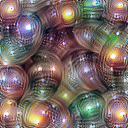

In [5]:
# We were recommended to play with Layer 4C first, so we begin...

# Layer 4C is referenced as mixed4c here, so let's try unit 0
_ = render.render_vis(model, "mixed4c:0")

512 1084.7463



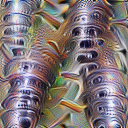

In [4]:
# We will also try the last unit in the list
_ = render.render_vis(model, "mixed4c:511")

512 1559.2372



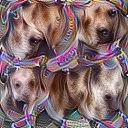

In [5]:
# See if we can generate the doggies in the example file
_ = render.render_vis(model, "mixed4c:484")

512 1731.5378



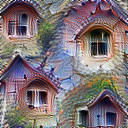

In [6]:
# I think that might be doggies above, let's try houses now
_ = render.render_vis(model, "mixed4c:509")

512 1373.5057



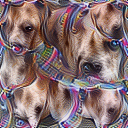

In [7]:
# See if re-run produces same image
_ = render.render_vis(model, "mixed4c:484")

###############################################################

## Now testing: Optimization based on image activation grids

The idea here is to test whether we can find patterns in activations, using a series of images, by noting and visualizing which neurons are activated by a given image/images.

In [3]:
# Note: Using the "very naive" method for now just to play with this, see 
#   if I can figure out just which channels are activated
def render_activation_grid_very_naive(img, model, layer="mixed4c", W=42, n_steps=256):
  
  # Get the activations
  with tf.Graph().as_default(), tf.Session() as sess:
    # Generate a placeholder tensor (vector) that must be
    # "fed" new values (done on the next line)
    t_input = tf.placeholder("float32", [None, None, None, 3])
    # Import the GNet model. t_input represents image tensors
    T = render.import_model(model, t_input, t_input)
    # This is what import model does to define T
    """
    def import_model(model, t_image, t_image_raw):

      model.import_graph(t_image, scope="import", forget_xy_shape=True)

      def T(layer):
        if layer == "input": return t_image_raw
        if layer == "labels": return model.labels
        return t_image.graph.get_tensor_by_name("import/%s:0"%layer)

      return T
    """
    acts = T(layer).eval({t_input: img[None]})[0]
  # Create the numpy n dimension array of activations, flattened into one
  # This is an array of 196 arrays of 528 elements each
  acts_flat = acts.reshape([-1] + [acts.shape[2]])

  
  # Render an image for each activation vector
  param_f = lambda: param.image(W, batch=acts_flat.shape[0])
  # Creates an objective function that maximizes our activations in this layer
  # Note that this objective likely activates across multiple channels
  obj = objectives.Objective.sum(
      [objectives.direction(layer, v, batch=n)
       for n,v in enumerate(acts_flat)
      ])
  # Note that each obj(ective) should be one of the layer's nodes/units
  print(objectives.as_objective(obj))
#   thresholds=(n_steps//2, n_steps)
#   vis_imgs = render.render_vis(model, obj, param_f, thresholds=thresholds)[-1]
  
    
#   # Combine the images and display the resulting grid
#   print("")
#   vis_imgs_ = vis_imgs.reshape(list(acts.shape[:2]) + [W, W, 3])
#   vis_imgs_cropped = vis_imgs_[:, :, 2:-2, 2:-2, :]
#   show(np.hstack(np.hstack(vis_imgs_cropped)))
#   return vis_imgs_cropped

In [4]:
# Keep investigating the above, but use the "better" vis model from here on out...

def render_activation_grid_less_naive(img, model, layer="mixed4d", W=42,
                                 n_groups=6, subsample_factor=1, n_steps=256):
  
  # Get the activations
  with tf.Graph().as_default(), tf.Session() as sess:
    t_input = tf.placeholder("float32", [None, None, None, 3])
    T = render.import_model(model, t_input, t_input)
    acts = T(layer).eval({t_input: img[None]})[0]
  acts_flat = acts.reshape([-1] + [acts.shape[2]])
  N = acts_flat.shape[0]
  
  # The trick to avoiding "decoherence" is to recognize images that are
  # for similar activation vectors and 
  if n_groups > 0:
    reducer = ChannelReducer(n_groups, "NMF")
    groups = reducer.fit_transform(acts_flat)
    groups /= groups.max(0)
  else:
    groups = np.zeros([])
    
  print(groups.shape)

  
  # The key trick to increasing memory efficiency is random sampling.
  # Even though we're visualizing lots of images, we only run a small
  # subset through the network at once. In order to do this, we'll need
  # to hold tensors in a tensorflow graph around the visualization process.
  
  with tf.Graph().as_default() as graph, tf.Session() as sess:
    
    
    # Using the groups, create a paramaterization of images that
    # partly shares paramters between the images for similar activation
    # vectors. Each one still has a full set of unique parameters, and could
    # optimize to any image. We're just making it easier to find solutions
    # where things are the same.
    group_imgs_raw = param.fft_image([n_groups, W, W, 3])
    unique_imgs_raw = param.fft_image([N, W, W, 3])
    opt_imgs = param.to_valid_rgb(tf.stack([
            0.7*unique_imgs_raw[i] + 
            0.5*sum(groups[i, j] * group_imgs_raw[j] for j in range(n_groups))
            for i in range(N) ]),
            decorrelate=True)
    
    # Construct a random batch to optimize this step
    batch_size = 64
    rand_inds = tf.random_uniform([batch_size], 0, N, dtype=tf.int32)
    pres_imgs = tf.gather(opt_imgs, rand_inds)
    pres_acts = tf.gather(acts_flat, rand_inds)
    obj = objectives.Objective.sum(
      [objectives.direction(layer, pres_acts[n], batch=n)
       for n in range(batch_size)
      ])
    
    # Actually do the optimization...
    T = render.make_vis_T(model, obj, param_f=pres_imgs)
    tf.global_variables_initializer().run()
    
    for i in range(n_steps):
      T("vis_op").run()
      if (i+1) % (n_steps//2) == 0:
        show(pres_imgs.eval()[::4])
    
    vis_imgs = opt_imgs.eval()
    
  # Combine the images and display the resulting grid
  print("")
  vis_imgs_ = vis_imgs.reshape(list(acts.shape[:2]) + [W, W, 3])
  vis_imgs_cropped = vis_imgs_[:, :, 2:-2, 2:-2, :]
  show(np.hstack(np.hstack(vis_imgs_cropped)))
  return vis_imgs_cropped

In [ ]:
img = load("https://storage.googleapis.com/lucid-static/building-blocks/examples/dog_cat.png")
_ = render_activation_grid_less_naive(img, model)


mixed3a
(784, 6)



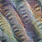
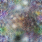
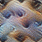
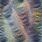
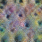
...
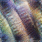
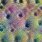
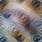
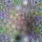


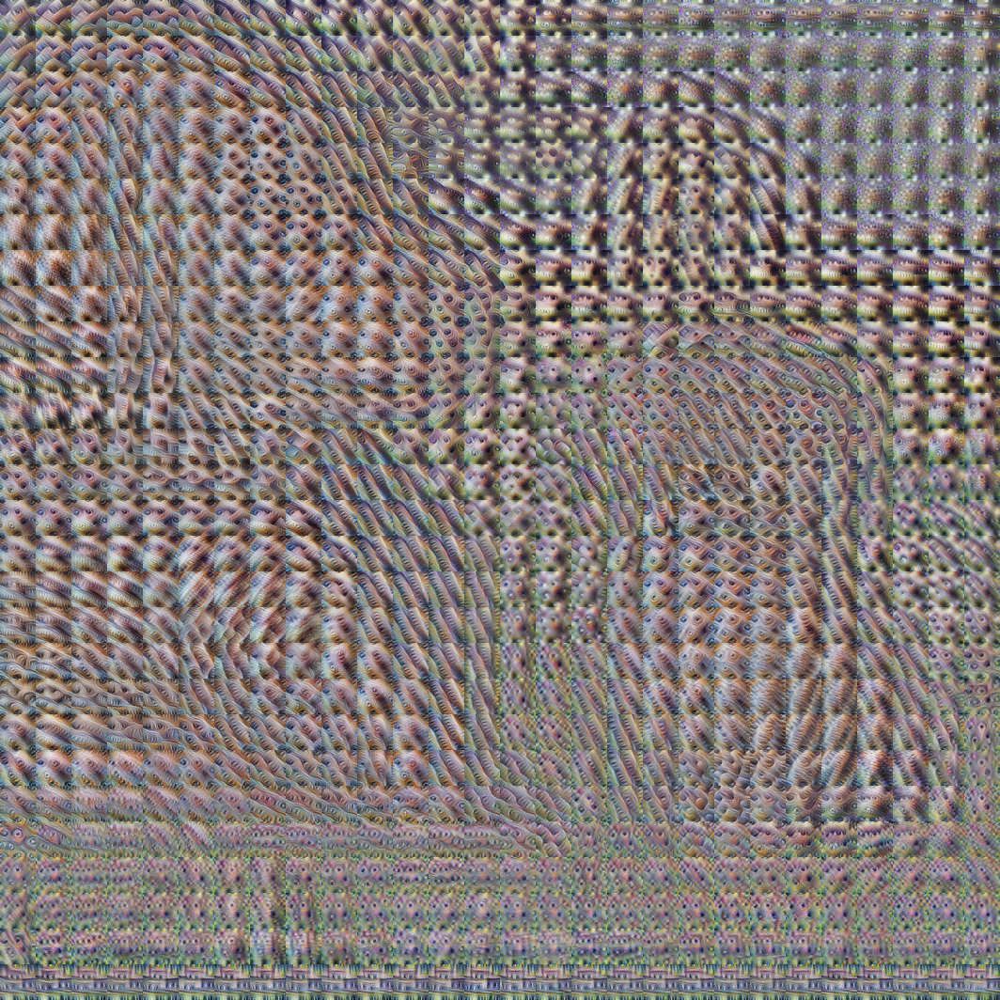

mixed4a
(196, 6)



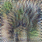
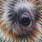
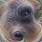
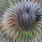
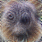
...
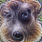
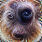
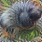
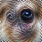


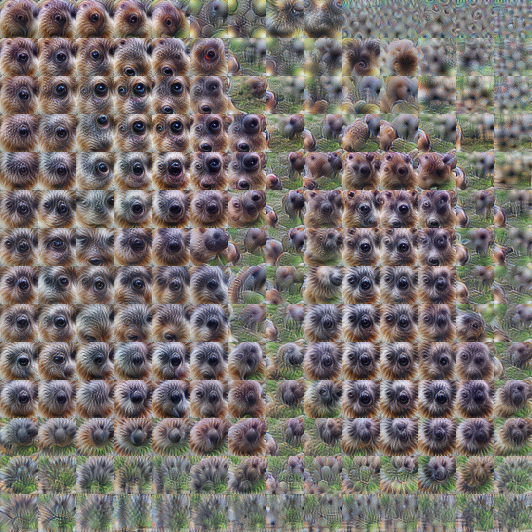

mixed4c
(196, 6)



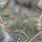
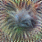
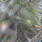
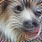
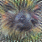
...
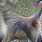
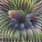
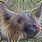
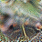


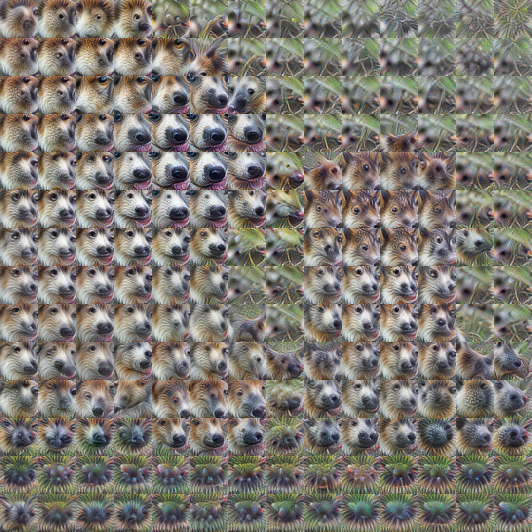

mixed4e
(196, 6)



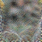
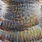
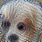
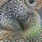
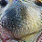
...
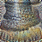
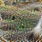
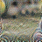
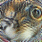


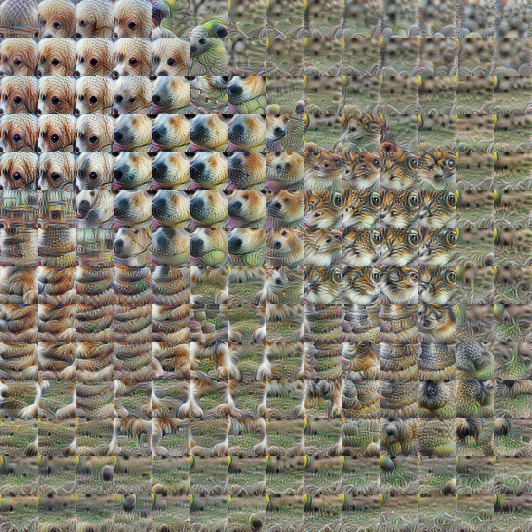

mixed5b
(49, 6)



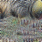
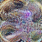
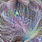
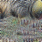
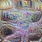
...
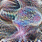
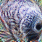
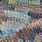
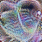


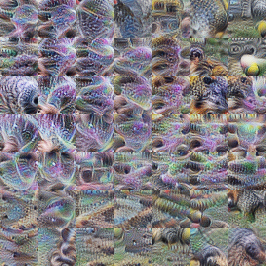

In [5]:
img = load("https://storage.googleapis.com/lucid-static/building-blocks/examples/dog_cat.png")
# Note I am using default params for W (width?) and steps
# Run the activation grid renderer across a few layers in GNet
for layer in ["mixed3a", "mixed4a", "mixed4c", "mixed4e", "mixed5b"]:
    print(layer)
    _ = render_activation_grid_less_naive(img, model, layer=layer)

mixed3a
(784, 6)



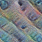
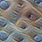
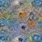
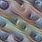
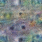
...
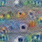
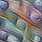
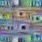
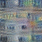


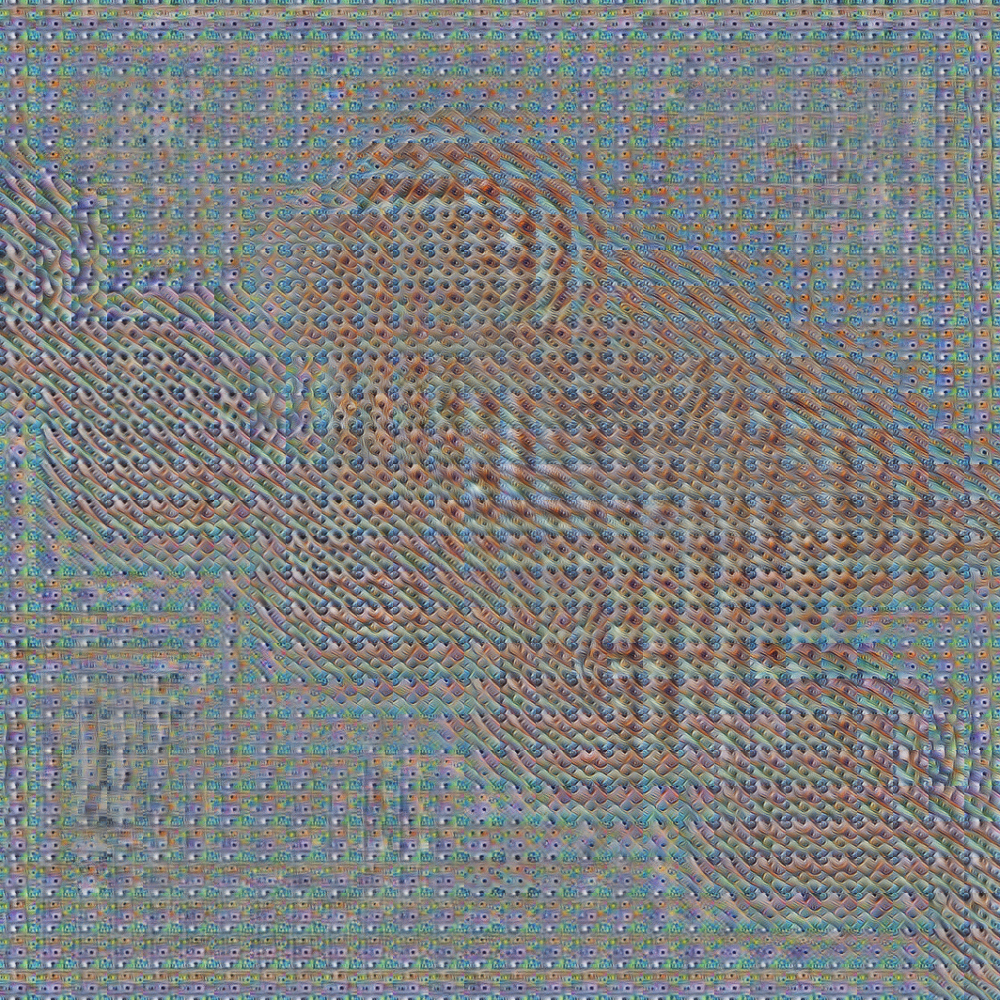

mixed4a
(196, 6)



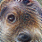
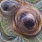
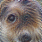
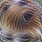
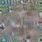
...
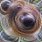
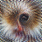
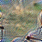
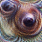


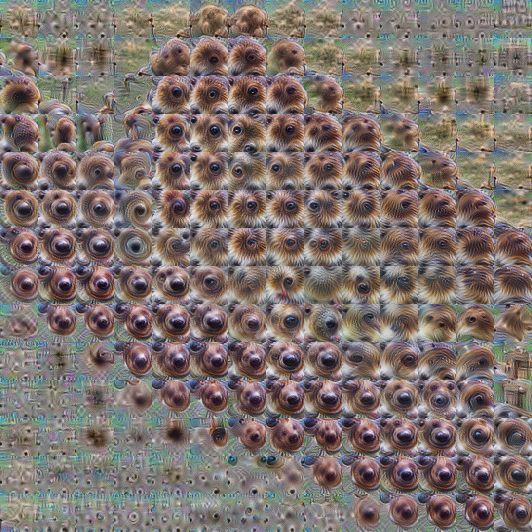

mixed4c
(196, 6)



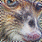
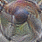
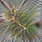
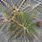
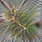
...
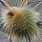
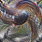
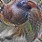
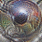


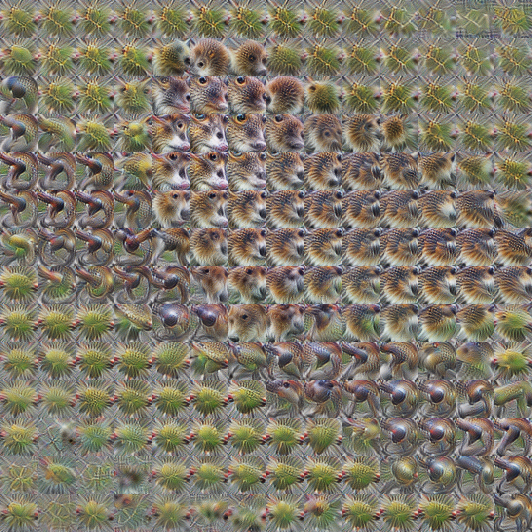

mixed4e
(196, 6)



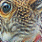
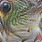
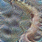
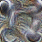
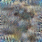
...
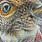
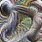
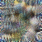
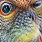


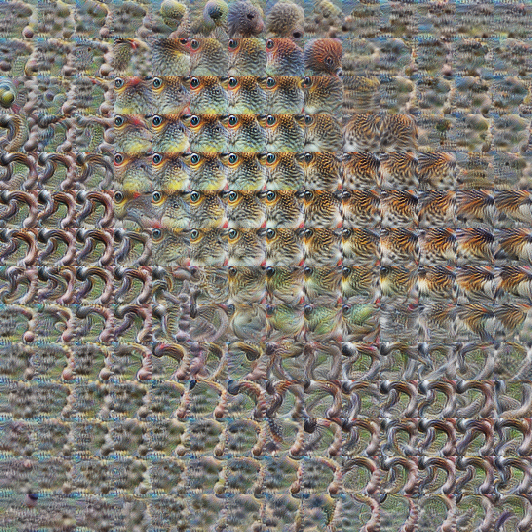

mixed5b
(49, 6)



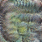
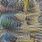
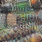
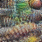
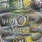
...
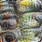
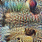
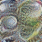
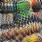


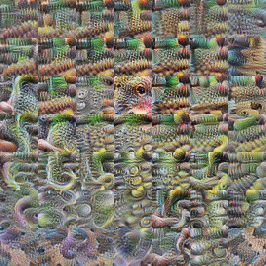

In [6]:
img = load("https://raw.githubusercontent.com/distillpub/post--building-blocks/master/public/examples/input_images/chain.jpeg")
# Note I am using default params for W (width?) and steps
# Run the activation grid renderer across a few layers in GNet
for layer in ["mixed3a", "mixed4a", "mixed4c", "mixed4e", "mixed5b"]:
    print(layer)
    _ = render_activation_grid_less_naive(img, model, layer=layer)

In [50]:
help(render.render_vis
    )

Help on function render_vis in module lucid.optvis.render:

render_vis(model, objective_f, param_f=None, optimizer=None, transforms=None, thresholds=(512,), print_objectives=None, verbose=True, relu_gradient_override=True, use_fixed_seed=False)
    Flexible optimization-base feature vis.
    
    There's a lot of ways one might wish to customize otpimization-based
    feature visualization. It's hard to create an abstraction that stands up
    to all the things one might wish to try.
    
    This function probably can't do *everything* you want, but it's much more
    flexible than a naive attempt. The basic abstraction is to split the problem
    into several parts. Consider the rguments:
    
    Args:
      model: The model to be visualized, from Alex' modelzoo.
      objective_f: The objective our visualization maximizes.
        See the objectives module for more details.
      param_f: Paramaterization of the image we're optimizing.
        See the paramaterization module for mo

In [52]:
help(objectives)

Help on module lucid.optvis.objectives in lucid.optvis:

NAME
    lucid.optvis.objectives - Objective functions for visualizing neural networks.

DESCRIPTION
    We represent objectives with a class `Objective` enclsoing functions of the
    form:
    
      (T) => TensorFlow Scalar
    
    Where `T` is a function that allows one to access the activations of different
    layers of the network. For example `T("mixed4a")` gives the activations for
    the layer mixed4a.
    
    This allows objectives to be declared outside the rendering function, but then
    actually constructed within its graph/session.

CLASSES
    builtins.object
        Objective
    
    class Objective(builtins.object)
     |  "A wrapper to make objective functions easy to combine.
     |  
     |  For example, suppose you want to optimize 20% for mixed4a:20 and 80% for
     |  mixed4a:21. Then you could use:
     |  
     |    objetive = 0.2 * channel("mixed4a", 20) + 0.8 * channel("mixed4a", 21)
     |  
    